# Pothole Detection with Evaluation
## Tugas Besar Pengolahan Citra Digital


## Pipeline Overview:
1. **Resizing** (640×480)
2. **Grayscale Conversion** (RGB → Gray)
3. **Adaptive Threshold** (Block size 101, C=10)
4. **Canny Edge Detection** (sigma=3, low=0, high=150)
5. **Post-processing** (Dilasi + Multi-level Filtering)
6. **Evaluation** (Precision, Recall, F1-Score, IoU)

In [41]:
# Import libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import os
from pathlib import Path
import pandas as pd

# Set matplotlib to display images properly
rcParams['figure.figsize'] = (15, 10)
%matplotlib inline

print("✅ OpenCV version:", cv2.__version__)
print("✅ NumPy version:", np.__version__)

✅ OpenCV version: 4.11.0
✅ NumPy version: 1.24.3


---
## Setup Dataset Path
Konfigurasi path dataset sesuai struktur folder

In [42]:
# Base dataset path
BASE_PATH = 'dataset'

# Dataset splits
TRAIN_IMAGES = os.path.join(BASE_PATH, 'train', 'images')
TRAIN_LABELS = os.path.join(BASE_PATH, 'train', 'labels')

TEST_IMAGES = os.path.join(BASE_PATH, 'test', 'images')
TEST_LABELS = os.path.join(BASE_PATH, 'test', 'labels')

VALID_IMAGES = os.path.join(BASE_PATH, 'valid', 'images')
VALID_LABELS = os.path.join(BASE_PATH, 'valid', 'labels')

# Verify paths exist
print("📁 Dataset Structure:")
for path_name, path in [("Train Images", TRAIN_IMAGES), 
                        ("Test Images", TEST_IMAGES), 
                        ("Valid Images", VALID_IMAGES)]:
    exists = os.path.exists(path)
    status = "✅" if exists else "❌"
    print(f"{status} {path_name}: {path}")
    if exists:
        num_files = len([f for f in os.listdir(path) if f.endswith(('.jpg', '.png', '.jpeg'))])
        print(f"   → {num_files} images found")

📁 Dataset Structure:
✅ Train Images: dataset\train\images
   → 465 images found
✅ Test Images: dataset\test\images
   → 67 images found
✅ Valid Images: dataset\valid\images
   → 133 images found


---
## Helper Function: Display Images Side-by-Side
Biar gampang compare before-after

In [43]:
def display_images(images, titles, cmap='gray', figsize=(15, 5)):
    """
    Display multiple images side-by-side
    
    Parameters:
    - images: list of images
    - titles: list of titles
    - cmap: colormap (default: 'gray')
    - figsize: figure size
    """
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    
    if n == 1:
        axes = [axes]
    
    for i, (img, title) in enumerate(zip(images, titles)):
        if len(img.shape) == 3:  # Color image (BGR)
            axes[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        else:  # Grayscale
            axes[i].imshow(img, cmap=cmap)
        axes[i].set_title(title, fontweight='bold')
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

print("✅ Helper function loaded")

✅ Helper function loaded


---
## Step 0: Load Test Image
Load gambar dari folder test/images

✅ Found 67 test images
   First 5 images: ['img-105_jpg.rf.7f718a87b964a1f9e37175bf98b72e5b.jpg', 'img-107_jpg.rf.557e64979b1a6e736840b2433ff18bd1.jpg', 'img-146_jpg.rf.ae6965029e28880037c46c328c772951.jpg', 'img-161_jpg.rf.5f9429f0ecc6a31fe74108fe1763753f.jpg', 'img-168_jpg.rf.c3fa211ddef6e68cf1c8e2562e2b67d9.jpg']

✅ Image loaded: img-105_jpg.rf.7f718a87b964a1f9e37175bf98b72e5b.jpg
   Shape: (720, 720, 3)
   - Height: 720 pixels
   - Width: 720 pixels
   - Channels: 3


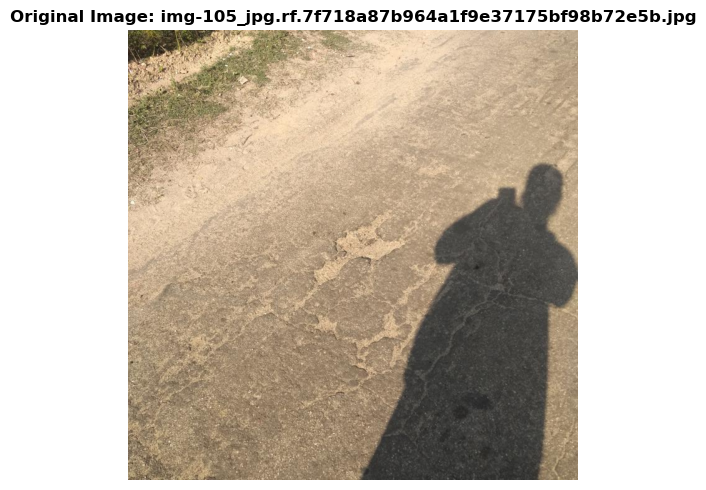

In [44]:
# Get list of images from test folder
test_images = [f for f in os.listdir(TEST_IMAGES) if f.endswith(('.jpg', '.png', '.jpeg'))]

if len(test_images) == 0:
    print("❌ No images found in test folder!")
    print(f"   Path: {TEST_IMAGES}")
else:
    print(f"✅ Found {len(test_images)} test images")
    print(f"   First 5 images: {test_images[:5]}")
    
    # Load first image for testing
    image_filename = test_images[0]
    image_path = os.path.join(TEST_IMAGES, image_filename)
    img_original = cv2.imread(image_path)
    
    if img_original is None:
        print(f"❌ Failed to load image: {image_path}")
    else:
        print(f"\n✅ Image loaded: {image_filename}")
        print(f"   Shape: {img_original.shape}")
        print(f"   - Height: {img_original.shape[0]} pixels")
        print(f"   - Width: {img_original.shape[1]} pixels")
        print(f"   - Channels: {img_original.shape[2]}")
        
        # Display original image
        display_images([img_original], [f'Original Image: {image_filename}'])

---
## Step 1: Resizing (640×480)
Normalisasi ukuran gambar untuk konsistensi processing

✅ Resized to: (480, 640, 3)


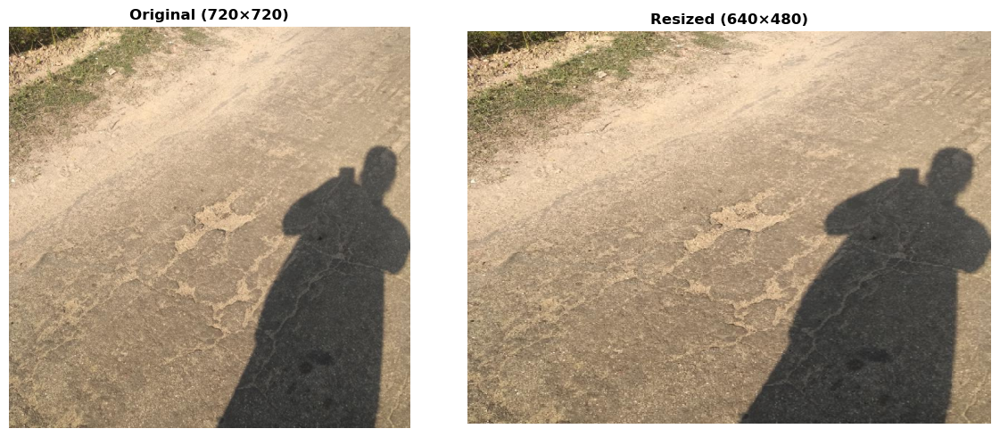

In [45]:
def resize_image(image, target_size=(640, 480)):
    """
    Resize image dengan Nearest Neighbor interpolation
    Aspect ratio dipertahankan
    
    Parameters:
    - image: input image
    - target_size: (width, height)
    
    Returns:
    - resized image
    """
    resized = cv2.resize(image, target_size, interpolation=cv2.INTER_NEAREST)
    return resized

# Apply resizing
img_resized = resize_image(img_original)

print(f"✅ Resized to: {img_resized.shape}")

# Display comparison
display_images(
    [img_original, img_resized],
    [f'Original ({img_original.shape[1]}×{img_original.shape[0]})', 
     f'Resized ({img_resized.shape[1]}×{img_resized.shape[0]})'],
    figsize=(12, 5)
)

---
## Step 2: Grayscale Conversion
Convert RGB → Grayscale menggunakan weighted formula

✅ Converted to grayscale: (480, 640)


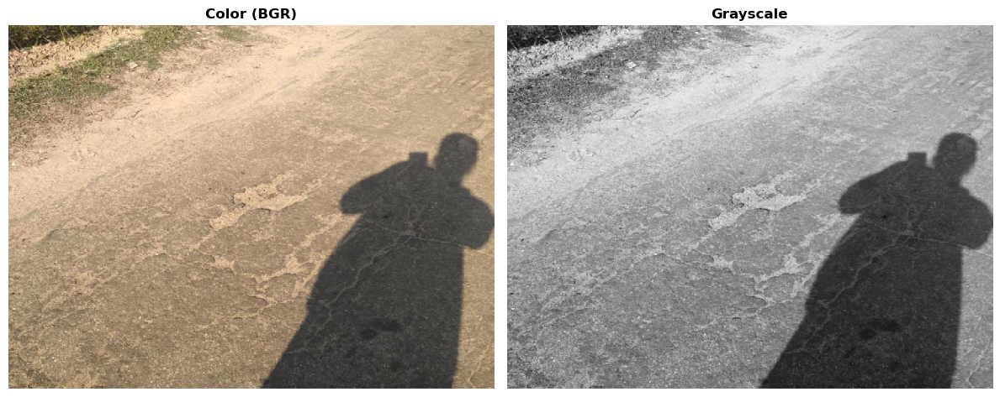

In [46]:
def convert_to_grayscale(image):
    """
    Convert BGR to Grayscale
    Formula: Gray = 0.299*R + 0.587*G + 0.114*B
    
    Parameters:
    - image: BGR image
    
    Returns:
    - grayscale image
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return gray

# Apply grayscale conversion
img_gray = convert_to_grayscale(img_resized)

print(f"✅ Converted to grayscale: {img_gray.shape}")

# Display comparison
display_images(
    [img_resized, img_gray],
    ['Color (BGR)', 'Grayscale'],
    figsize=(12, 5)
)

---
## Step 3: Adaptive Threshold
Binarisasi adaptif untuk handle lighting yang tidak merata

✅ Adaptive threshold applied
   Parameters: block_size=101, C=20


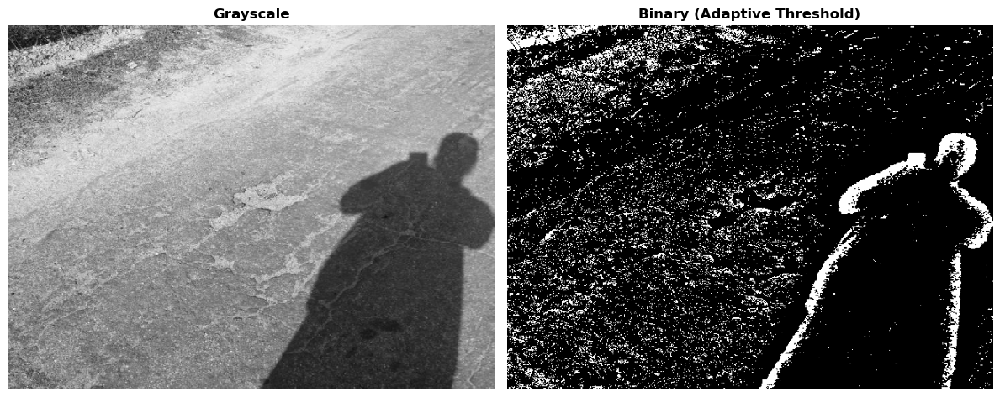

In [47]:
def adaptive_threshold(image, block_size=101, C=20):
    """
    Apply adaptive thresholding
    
    Parameters:
    - image: grayscale image
    - block_size: size of pixel neighborhood (must be odd)
    - C: constant subtracted from mean
    
    Returns:
    - binary image
    """
    binary = cv2.adaptiveThreshold(
        image,
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        block_size,
        C
    )
    return binary

# Apply adaptive threshold
img_binary = adaptive_threshold(img_gray)

print(f"✅ Adaptive threshold applied")
print(f"   Parameters: block_size=101, C={20}")

# Display comparison
display_images(
    [img_gray, img_binary],
    ['Grayscale', 'Binary (Adaptive Threshold)'],
    figsize=(12, 5)
)

---
## Step 4: Canny Edge Detection
Deteksi tepi menggunakan Canny algorithm

✅ Canny edge detection applied
   Parameters: sigma=3, low=0, high=150


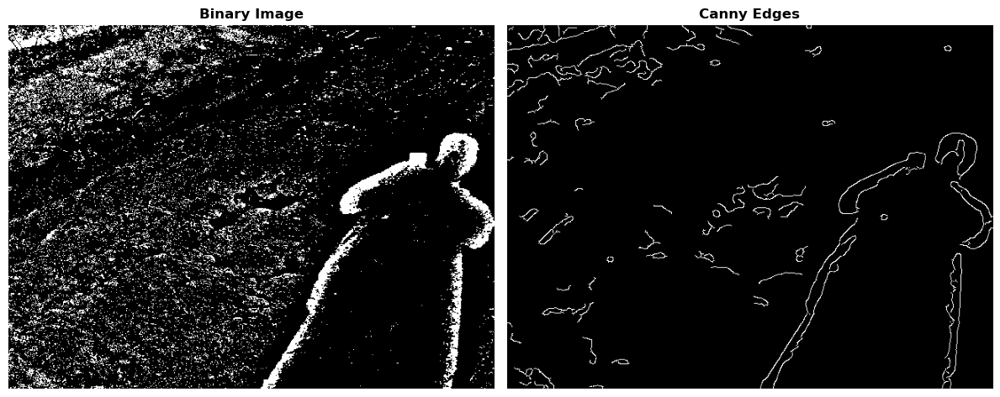

In [48]:
def canny_edge_detection(image, sigma=3, low_threshold=0, high_threshold=150):
    """
    Apply Canny edge detection
    
    Parameters:
    - image: grayscale image
    - sigma: Gaussian blur sigma
    - low_threshold: lower threshold for edge linking
    - high_threshold: upper threshold for edge detection
    
    Returns:
    - edge image
    """
    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(image, (0, 0), sigma)
    
    # Apply Canny
    edges = cv2.Canny(blurred, low_threshold, high_threshold)
    
    return edges

# Apply Canny edge detection
img_edges = canny_edge_detection(img_binary)

print(f"✅ Canny edge detection applied")
print(f"   Parameters: sigma=3, low=0, high=150")

# Display comparison
display_images(
    [img_binary, img_edges],
    ['Binary Image', 'Canny Edges'],
    figsize=(12, 5)
)

---
## Step 5: Post-processing (Dilation)
Perkuat edge detection dengan morfologi dilasi

✅ Dilation applied
   Parameters: kernel=(5,5), iterations=2


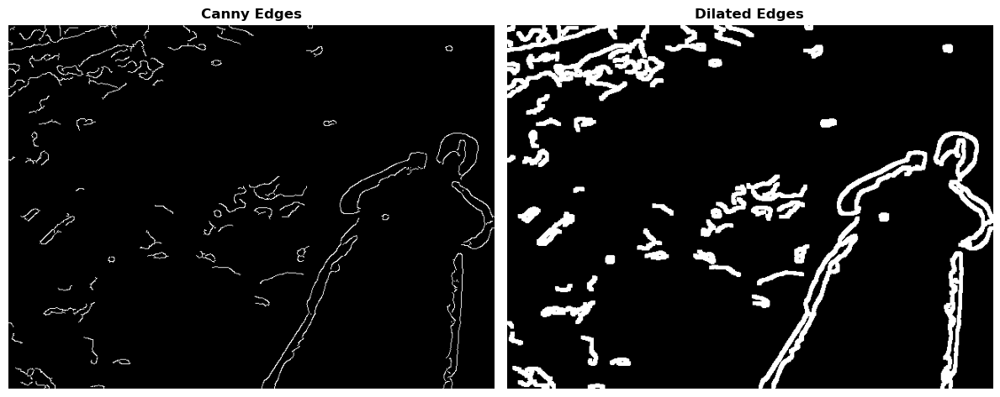

In [49]:
def dilate_edges(image, kernel_size=(3, 3), iterations=2):
    """
    Apply dilation to strengthen edges
    
    Parameters:
    - image: edge image
    - kernel_size: size of structuring element
    - iterations: number of dilations
    
    Returns:
    - dilated image
    """
    kernel = np.ones(kernel_size, np.uint8)
    dilated = cv2.dilate(image, kernel, iterations=iterations)
    return dilated

# Apply dilation
img_dilated = dilate_edges(img_edges)

print(f"✅ Dilation applied")
print(f"   Parameters: kernel=(5,5), iterations=2")

# Display comparison
display_images(
    [img_edges, img_dilated],
    ['Canny Edges', 'Dilated Edges'],
    figsize=(12, 5)
)

---
## Step 6: Contour Detection & Filtering
Deteksi dan filter kontour untuk identifikasi pothole

In [50]:
def detect_and_filter_potholes(image, min_area=500, max_area=50000, min_aspect_ratio=0.3, max_aspect_ratio=3.0):
    """
    Detect contours and filter based on area and aspect ratio
    
    Parameters:
    - image: binary edge image
    - min_area: minimum contour area
    - max_area: maximum contour area
    - min_aspect_ratio: minimum width/height ratio
    - max_aspect_ratio: maximum width/height ratio
    
    Returns:
    - list of valid pothole bounding boxes [(x, y, w, h), ...]
    - all contours for debugging
    """
    # Find contours
    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    valid_potholes = []
    
    for contour in contours:
        # Get bounding box
        x, y, w, h = cv2.boundingRect(contour)
        area = cv2.contourArea(contour)
        
        # Calculate aspect ratio
        aspect_ratio = w / h if h != 0 else 0
        
        # Filter by area and aspect ratio
        if (min_area <= area <= max_area and 
            min_aspect_ratio <= aspect_ratio <= max_aspect_ratio):
            valid_potholes.append((x, y, w, h))
    
    return valid_potholes, contours

# Detect and filter potholes
valid_potholes, all_contours = detect_and_filter_potholes(img_dilated)

print(f"✅ Contour detection complete")
print(f"   Total contours found: {len(all_contours)}")
print(f"   Valid potholes: {len(valid_potholes)}")
print(f"   Filter criteria:")
print(f"   - Area: 500-50000 pixels")
print(f"   - Aspect ratio: 0.3-3.0")

✅ Contour detection complete
   Total contours found: 50
   Valid potholes: 10
   Filter criteria:
   - Area: 500-50000 pixels
   - Aspect ratio: 0.3-3.0


---
## Step 7: Draw Results
Visualisasi hasil deteksi pada gambar original

✅ Detection visualization complete
   10 potholes marked


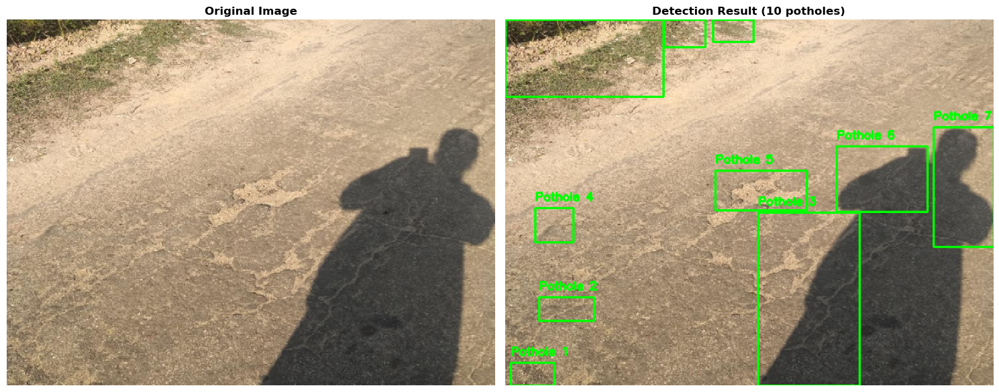

In [51]:
def draw_detections(image, potholes, color=(0, 255, 0), thickness=2):
    """
    Draw bounding boxes on image
    
    Parameters:
    - image: original image
    - potholes: list of bounding boxes
    - color: BGR color tuple
    - thickness: line thickness
    
    Returns:
    - image with drawn boxes
    """
    result = image.copy()
    
    for i, (x, y, w, h) in enumerate(potholes, 1):
        # Draw rectangle
        cv2.rectangle(result, (x, y), (x+w, y+h), color, thickness)
        
        # Add label
        label = f'Pothole {i}'
        cv2.putText(result, label, (x, y-10), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    
    return result

# Draw results on resized image
img_result = draw_detections(img_resized, valid_potholes)

print(f"✅ Detection visualization complete")
print(f"   {len(valid_potholes)} potholes marked")

# Display final result
display_images(
    [img_resized, img_result],
    ['Original Image', f'Detection Result ({len(valid_potholes)} potholes)'],
    figsize=(15, 7)
)

---
## Complete Pipeline Visualization
Lihat semua step dalam satu visualisasi

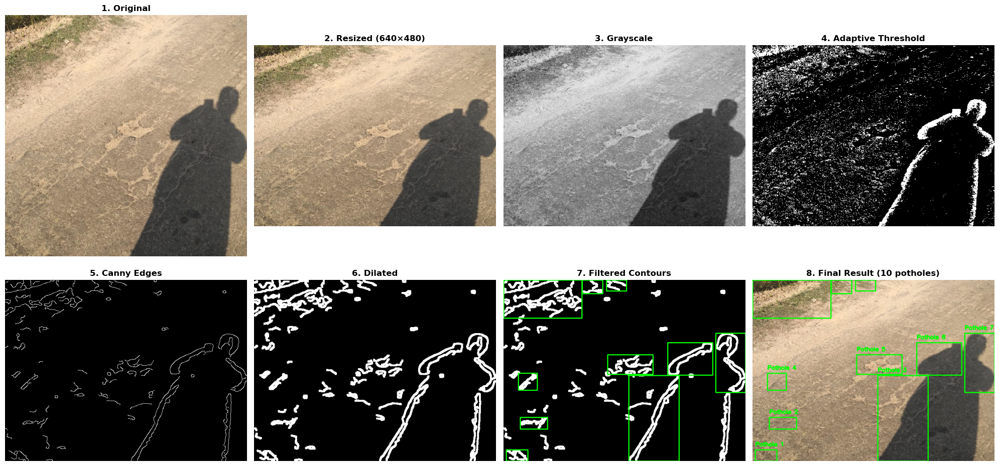

✅ Complete pipeline visualization


In [52]:
# Display complete pipeline
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# Row 1
axes[0, 0].imshow(cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('1. Original', fontweight='bold')
axes[0, 0].axis('off')

axes[0, 1].imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('2. Resized (640×480)', fontweight='bold')
axes[0, 1].axis('off')

axes[0, 2].imshow(img_gray, cmap='gray')
axes[0, 2].set_title('3. Grayscale', fontweight='bold')
axes[0, 2].axis('off')

axes[0, 3].imshow(img_binary, cmap='gray')
axes[0, 3].set_title('4. Adaptive Threshold', fontweight='bold')
axes[0, 3].axis('off')

# Row 2
axes[1, 0].imshow(img_edges, cmap='gray')
axes[1, 0].set_title('5. Canny Edges', fontweight='bold')
axes[1, 0].axis('off')

axes[1, 1].imshow(img_dilated, cmap='gray')
axes[1, 1].set_title('6. Dilated', fontweight='bold')
axes[1, 1].axis('off')

# Draw contours on dilated for visualization
img_contours = cv2.cvtColor(img_dilated, cv2.COLOR_GRAY2BGR)
for (x, y, w, h) in valid_potholes:
    cv2.rectangle(img_contours, (x, y), (x+w, y+h), (0, 255, 0), 2)

axes[1, 2].imshow(cv2.cvtColor(img_contours, cv2.COLOR_BGR2RGB))
axes[1, 2].set_title('7. Filtered Contours', fontweight='bold')
axes[1, 2].axis('off')

axes[1, 3].imshow(cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB))
axes[1, 3].set_title(f'8. Final Result ({len(valid_potholes)} potholes)', fontweight='bold')
axes[1, 3].axis('off')

plt.tight_layout()
plt.show()

print("✅ Complete pipeline visualization")

---
# COMPARISON SECTION
---
## Ground Truth Label Loading
Fungsi untuk load dan parse YOLO format labels

In [53]:
def load_yolo_labels(label_path, img_width, img_height):
    """
    Load YOLO format labels and convert to bounding boxes
    
    YOLO format: class x_center y_center width height (normalized 0-1)
    
    Parameters:
    - label_path: path to .txt label file
    - img_width: image width for denormalization
    - img_height: image height for denormalization
    
    Returns:
    - list of bounding boxes [(x, y, w, h), ...] in pixel coordinates
    """
    boxes = []
    
    if not os.path.exists(label_path):
        return boxes
    
    with open(label_path, 'r') as f:
        lines = f.readlines()
    
    for line in lines:
        parts = line.strip().split()
        if len(parts) >= 5:
            # Parse YOLO format
            class_id = int(parts[0])
            x_center_norm = float(parts[1])
            y_center_norm = float(parts[2])
            width_norm = float(parts[3])
            height_norm = float(parts[4])
            
            # Denormalize to pixel coordinates
            x_center = x_center_norm * img_width
            y_center = y_center_norm * img_height
            width = width_norm * img_width
            height = height_norm * img_height
            
            # Convert to (x, y, w, h) format (top-left corner)
            x = int(x_center - width / 2)
            y = int(y_center - height / 2)
            w = int(width)
            h = int(height)
            
            boxes.append((x, y, w, h))
    
    return boxes

print("✅ Label loading function loaded")

✅ Label loading function loaded


---
## Compare Current Image
Bandingkan jumlah boxes: Ground Truth vs Predictions

In [54]:
# Load ground truth for current image
label_filename = os.path.splitext(image_filename)[0] + '.txt'
label_path = os.path.join(TEST_LABELS, label_filename)

print(f"📂 Loading ground truth: {label_filename}")
gt_boxes = load_yolo_labels(label_path, 640, 480)

print(f"\n✅ Comparison Results:")
print(f"   Ground Truth Boxes:  {len(gt_boxes)}")
print(f"   Predicted Boxes:     {len(valid_potholes)}")
print(f"   Difference:          {len(valid_potholes) - len(gt_boxes)} boxes")

📂 Loading ground truth: img-105_jpg.rf.7f718a87b964a1f9e37175bf98b72e5b.txt

✅ Comparison Results:
   Ground Truth Boxes:  2
   Predicted Boxes:     10
   Difference:          8 boxes


---
## Visualize Comparison
Compare ground truth vs predictions side by side

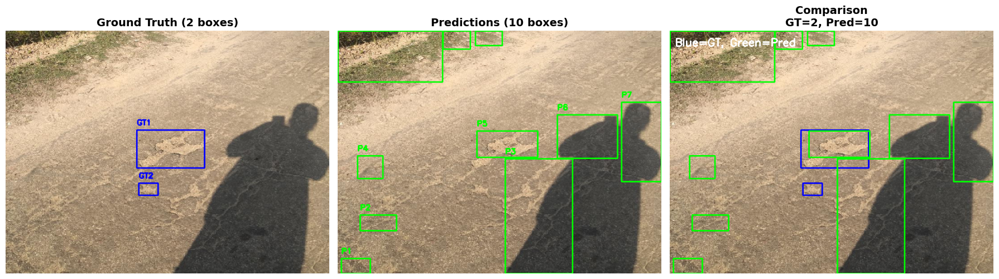

✅ Comparison visualization complete


In [55]:
# Draw ground truth (blue)
img_gt = img_resized.copy()
for i, (x, y, w, h) in enumerate(gt_boxes, 1):
    cv2.rectangle(img_gt, (x, y), (x+w, y+h), (255, 0, 0), 2)  # Blue
    cv2.putText(img_gt, f'GT{i}', (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

# Draw predictions (green)
img_pred = img_resized.copy()
for i, (x, y, w, h) in enumerate(valid_potholes, 1):
    cv2.rectangle(img_pred, (x, y), (x+w, y+h), (0, 255, 0), 2)  # Green
    cv2.putText(img_pred, f'P{i}', (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Draw comparison (both)
img_comparison = img_resized.copy()
for x, y, w, h in gt_boxes:
    cv2.rectangle(img_comparison, (x, y), (x+w, y+h), (255, 0, 0), 2)  # Blue for GT
for x, y, w, h in valid_potholes:
    cv2.rectangle(img_comparison, (x, y), (x+w, y+h), (0, 255, 0), 2)  # Green for Pred

# Add legend
cv2.putText(img_comparison, 'Blue=GT, Green=Pred', (10, 30), 
           cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

# Display
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB))
axes[0].set_title(f'Ground Truth ({len(gt_boxes)} boxes)', fontweight='bold', fontsize=14)
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB))
axes[1].set_title(f'Predictions ({len(valid_potholes)} boxes)', fontweight='bold', fontsize=14)
axes[1].axis('off')

axes[2].imshow(cv2.cvtColor(img_comparison, cv2.COLOR_BGR2RGB))
axes[2].set_title(f'Comparison\nGT={len(gt_boxes)}, Pred={len(valid_potholes)}', 
                 fontweight='bold', fontsize=14)
axes[2].axis('off')

plt.tight_layout()
plt.show()

print("✅ Comparison visualization complete")

---
## Batch Comparison on Multiple Images
Process dan bandingkan GT vs Predictions pada multiple images

In [56]:
def process_and_compare_batch(image_dir, label_dir, max_images=10):
    """
    Process and compare multiple images
    
    Parameters:
    - image_dir: directory containing images
    - label_dir: directory containing labels
    - max_images: maximum number of images to process
    
    Returns:
    - List of results with images and box counts
    """
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    
    if max_images:
        image_files = image_files[:max_images]
    
    results = []
    
    print(f"🔄 Processing {len(image_files)} images...\n")
    
    for i, img_name in enumerate(image_files, 1):
        # Load and process image
        img_path = os.path.join(image_dir, img_name)
        img = cv2.imread(img_path)
        
        if img is None:
            continue
        
        # Pipeline
        img_resized = resize_image(img)
        img_gray = convert_to_grayscale(img_resized)
        img_binary = adaptive_threshold(img_gray)
        img_edges = canny_edge_detection(img_binary)
        img_dilated = dilate_edges(img_edges)
        pred_boxes, _ = detect_and_filter_potholes(img_dilated)
        
        # Load ground truth
        label_name = os.path.splitext(img_name)[0] + '.txt'
        label_path = os.path.join(label_dir, label_name)
        gt_boxes = load_yolo_labels(label_path, 640, 480)
        
        # Create comparison image
        img_comparison = img_resized.copy()
        
        # Draw GT boxes (blue)
        for x, y, w, h in gt_boxes:
            cv2.rectangle(img_comparison, (x, y), (x+w, y+h), (255, 0, 0), 2)
        
        # Draw Pred boxes (green)
        for x, y, w, h in pred_boxes:
            cv2.rectangle(img_comparison, (x, y), (x+w, y+h), (0, 255, 0), 2)
        
        # Add legend
        cv2.putText(img_comparison, 'Blue=GT, Green=Pred', (10, 25), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
        cv2.putText(img_comparison, f'GT={len(gt_boxes)}, Pred={len(pred_boxes)}', (10, 50), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
        
        results.append({
            'image_name': img_name,
            'image': img_comparison,
            'gt_count': len(gt_boxes),
            'pred_count': len(pred_boxes),
            'difference': len(pred_boxes) - len(gt_boxes)
        })
        
        print(f"✅ [{i:2d}/{len(image_files)}] {img_name:30s} | GT={len(gt_boxes):2d} Pred={len(pred_boxes):2d} Diff={len(pred_boxes) - len(gt_boxes):+3d}")
    
    return results

print("✅ Batch comparison function loaded")

✅ Batch comparison function loaded


---
## Run Batch Comparison
Process 10 gambar dan tampilkan hasilnya

In [57]:
# Run comparison on 10 images
comparison_results = process_and_compare_batch(TEST_IMAGES, TEST_LABELS, max_images=10)

print("\n" + "="*70)
print("📊 COMPARISON SUMMARY")
print("="*70)

total_gt = sum([r['gt_count'] for r in comparison_results])
total_pred = sum([r['pred_count'] for r in comparison_results])

print(f"\nTotal Images Processed: {len(comparison_results)}")
print(f"Total GT Boxes:         {total_gt}")
print(f"Total Predicted Boxes:  {total_pred}")
print(f"Total Difference:       {total_pred - total_gt:+d}")
print(f"Average GT per image:   {total_gt / len(comparison_results):.2f}")
print(f"Average Pred per image: {total_pred / len(comparison_results):.2f}")
print("="*70)

🔄 Processing 10 images...

✅ [ 1/10] img-105_jpg.rf.7f718a87b964a1f9e37175bf98b72e5b.jpg | GT= 2 Pred=10 Diff= +8
✅ [ 2/10] img-107_jpg.rf.557e64979b1a6e736840b2433ff18bd1.jpg | GT= 1 Pred= 9 Diff= +8
✅ [ 3/10] img-146_jpg.rf.ae6965029e28880037c46c328c772951.jpg | GT= 1 Pred= 7 Diff= +6
✅ [ 4/10] img-161_jpg.rf.5f9429f0ecc6a31fe74108fe1763753f.jpg | GT= 1 Pred=12 Diff=+11
✅ [ 5/10] img-168_jpg.rf.c3fa211ddef6e68cf1c8e2562e2b67d9.jpg | GT= 2 Pred= 8 Diff= +6
✅ [ 6/10] img-179_jpg.rf.f5059daa7649e7097e2bef4ea53a300e.jpg | GT= 5 Pred=24 Diff=+19
✅ [ 7/10] img-195_jpg.rf.117d8fabe41a336e99a197b6e9d3b1ec.jpg | GT= 2 Pred=11 Diff= +9
✅ [ 8/10] img-196_jpg.rf.2d63f8a5b4ecabac2db40344758187b9.jpg | GT= 3 Pred=20 Diff=+17
✅ [ 9/10] img-217_jpg.rf.a7ab655a24bd48ab47d1c33092678fee.jpg | GT= 2 Pred=15 Diff=+13
✅ [10/10] img-238_jpg.rf.45d78b98a743f69f9845cbf22d5dedf5.jpg | GT= 1 Pred= 8 Diff= +7

📊 COMPARISON SUMMARY

Total Images Processed: 10
Total GT Boxes:         20
Total Predicted Boxes:  12

---
## Visualize 10 Images Comparison
Tampilkan semua 10 gambar dalam grid 5x2

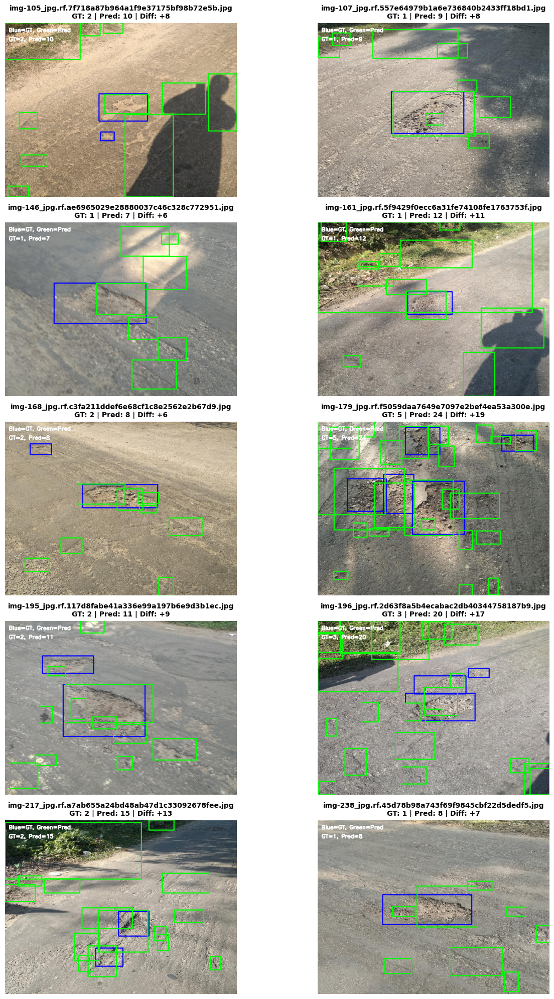


✅ Visualized 10 images in grid layout


In [58]:
# Create visualization grid (5 rows x 2 columns)
n_images = len(comparison_results)
n_cols = 2
n_rows = (n_images + n_cols - 1) // n_cols  # Ceiling division

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 4))

# Flatten axes for easier indexing
if n_rows == 1:
    axes = axes.reshape(1, -1)
axes_flat = axes.flatten()

for idx, result in enumerate(comparison_results):
    ax = axes_flat[idx]
    ax.imshow(cv2.cvtColor(result['image'], cv2.COLOR_BGR2RGB))
    
    title = f"{result['image_name']}\nGT: {result['gt_count']} | Pred: {result['pred_count']} | Diff: {result['difference']:+d}"
    ax.set_title(title, fontweight='bold', fontsize=10)
    ax.axis('off')

# Hide unused subplots
for idx in range(n_images, len(axes_flat)):
    axes_flat[idx].axis('off')

plt.tight_layout()
plt.show()

print(f"\n✅ Visualized {n_images} images in grid layout")

---
## Display Results Table

In [59]:
# Create DataFrame for easy viewing
df_comparison = pd.DataFrame([{
    'Image': r['image_name'],
    'GT Boxes': r['gt_count'],
    'Pred Boxes': r['pred_count'],
    'Difference': r['difference']
} for r in comparison_results])

print("\n📋 Comparison Table:")
print(df_comparison.to_string(index=False))

print("\n📈 Statistics:")
print(f"Mean GT Boxes:   {df_comparison['GT Boxes'].mean():.2f}")
print(f"Mean Pred Boxes: {df_comparison['Pred Boxes'].mean():.2f}")
print(f"Mean Difference: {df_comparison['Difference'].mean():.2f}")
print(f"Std GT Boxes:    {df_comparison['GT Boxes'].std():.2f}")
print(f"Std Pred Boxes:  {df_comparison['Pred Boxes'].std():.2f}")


📋 Comparison Table:
                                              Image  GT Boxes  Pred Boxes  Difference
img-105_jpg.rf.7f718a87b964a1f9e37175bf98b72e5b.jpg         2          10           8
img-107_jpg.rf.557e64979b1a6e736840b2433ff18bd1.jpg         1           9           8
img-146_jpg.rf.ae6965029e28880037c46c328c772951.jpg         1           7           6
img-161_jpg.rf.5f9429f0ecc6a31fe74108fe1763753f.jpg         1          12          11
img-168_jpg.rf.c3fa211ddef6e68cf1c8e2562e2b67d9.jpg         2           8           6
img-179_jpg.rf.f5059daa7649e7097e2bef4ea53a300e.jpg         5          24          19
img-195_jpg.rf.117d8fabe41a336e99a197b6e9d3b1ec.jpg         2          11           9
img-196_jpg.rf.2d63f8a5b4ecabac2db40344758187b9.jpg         3          20          17
img-217_jpg.rf.a7ab655a24bd48ab47d1c33092678fee.jpg         2          15          13
img-238_jpg.rf.45d78b98a743f69f9845cbf22d5dedf5.jpg         1           8           7

📈 Statistics:
Mean GT Boxes:   2

---
## Save Comparison Results

In [60]:
# Save to CSV
output_csv = 'comparison_results.csv'
df_comparison.to_csv(output_csv, index=False)
print(f"✅ Results saved to: {output_csv}")

# Save summary to text file
output_txt = 'comparison_summary.txt'
with open(output_txt, 'w') as f:
    f.write("="*70 + "\n")
    f.write("POTHOLE DETECTION - GT vs PREDICTION COMPARISON\n")
    f.write("="*70 + "\n\n")
    
    f.write(f"Total Images Processed: {len(comparison_results)}\n")
    f.write(f"Total GT Boxes:         {total_gt}\n")
    f.write(f"Total Predicted Boxes:  {total_pred}\n")
    f.write(f"Total Difference:       {total_pred - total_gt:+d}\n\n")
    
    f.write("Per-Image Results:\n")
    f.write("-" * 70 + "\n")
    f.write(f"{'Image':<30} {'GT':>5} {'Pred':>5} {'Diff':>6}\n")
    f.write("-" * 70 + "\n")
    
    for r in comparison_results:
        f.write(f"{r['image_name']:<30} {r['gt_count']:>5} {r['pred_count']:>5} {r['difference']:>+6}\n")
    
    f.write("-" * 70 + "\n")
    f.write(f"{'AVERAGE':<30} {df_comparison['GT Boxes'].mean():>5.1f} {df_comparison['Pred Boxes'].mean():>5.1f} {df_comparison['Difference'].mean():>+6.1f}\n")
    f.write("="*70 + "\n")

print(f"✅ Summary saved to: {output_txt}")

✅ Results saved to: comparison_results.csv
✅ Summary saved to: comparison_summary.txt
